In [2]:
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import pandas as pd
import cartopy.crs as ccrs
import glob
import obspy as obs
from geopy import distance

In [3]:
workingdir = '/Users/rshimony/Desktop/WillametteValley/salem_eq/observed_data_salem_1hz/'

data_strm = obs.read(workingdir + '*_raw.sac')

data_stations = []

for i in range(len(data_strm)):
    data_stations.append(data_strm[i].stats.station)
    
data_stations_unq = np.unique(data_stations)

In [190]:
# plotsdir = '/Users/rshimony/Desktop/WillametteValley/Models/dist2depth_s_grav_n/'
# obs_dir = '/Users/rshimony/Desktop/WillametteValley/val_event_data/observed_data_valevent/'
# synthetic_dir = "/Users/rshimony/Desktop/WillametteValley/Models/dist2depth_s_grav_n/results/"
# # synthetic_dir = "/Volumes/Roey's_BU/Results_dist2depth_model_novs30_nograv/lower_fmax_model/h100/results/"
# stephenson_dir = '/Users/rshimony/Desktop/WillametteValley/4kmdepth_mw4_seismograms/'


In [4]:
split1 = workingdir.split('/')[-2]
split2 = split1.split('_')[-1]
print(split1)
print(split2)

observed_data_salem_1hz
1hz


In [5]:
data_stations_unq

array(['2172', '7042', 'ABER', 'ALSE', 'ALST', 'ALVY', 'ASR', 'AUG',
       'B019', 'B020', 'B022', 'B023', 'B024', 'B026', 'B027', 'B028',
       'B030', 'B031', 'B032', 'B201', 'B202', 'B203', 'BABR', 'BAYC',
       'BCAT', 'BEAV', 'BEER', 'BLEU', 'BLOW', 'BOIS', 'BOW2', 'BRO',
       'BRSP', 'BUCK', 'CARM', 'CCFR', 'CCSO', 'CDF', 'CHZZ', 'CINE',
       'CNNB', 'COBRA', 'COLT', 'COR', 'COWL', 'CRCK', 'CSOK', 'DEAN',
       'DEPO', 'DNIS', 'DRAN', 'DREG', 'EDM', 'ELK', 'ELSIE', 'EOLA',
       'ETON', 'EYES', 'FALCO', 'FALZ', 'FISH2', 'FL2', 'GROV', 'GRSDL',
       'GUAC', 'HAGG', 'HAOK', 'HAPY', 'HAZEL', 'HBO', 'HIYU', 'HOA',
       'HSO', 'HSO2', 'HSR', 'HUBA', 'HUSB', 'IRYS', 'JEDS', 'JEFF', 'JRO',
       'KEEL', 'KELS', 'KMO', 'KNAP', 'KUHN', 'KVCS', 'LAKE', 'LANE',
       'LCCR', 'LCW2', 'LEAB', 'LEBA', 'LEVE', 'LEWL', 'LINC', 'LOCK',
       'LOKI', 'LOO', 'LOWP', 'LSON', 'LWCK', 'MAPT', 'MAR', 'MARQ',
       'MEGW', 'MINN', 'MONKS', 'MONO', 'MOON', 'MPLT', 'MPO', 'MRIN',
       '

In [6]:
inner1_f = pd.read_csv('/Users/rshimony/Desktop/WillametteValley/basin_depth_poly_inner1.csv')
lon_inner1 = inner1_f['inner1_lon']
lat_inner1 = inner1_f['inner1_lat']

inner2_f = pd.read_csv('/Users/rshimony/Desktop/WillametteValley/basin_depth_poly_inner2.csv')
lon_inner2 = inner2_f['inner2_lon']
lat_inner2 = inner2_f['inner2_lat']

outer_f = pd.read_csv('/Users/rshimony/Desktop/WillametteValley/basin_depth_poly_outer.csv')
lon_outer = outer_f['outer_lon']
lat_outer = outer_f['outer_lat']   
  
inner1_poly = np.zeros((len(lon_inner1),2))
for i in range(len(lon_inner1)):
    inner1_poly[i,0] = lon_inner1[i]
    inner1_poly[i,1] = lat_inner1[i]
    
inner2_poly = np.zeros((len(lon_inner2),2))
for i in range(len(lon_inner2)):
    inner2_poly[i,0] = lon_inner2[i]
    inner2_poly[i,1] = lat_inner2[i]
    
outer_poly = np.zeros((len(lon_outer),2))
for i in range(len(lon_outer)):
    outer_poly[i,0] = lon_outer[i]
    outer_poly[i,1] = lat_outer[i]

full_poly = Polygon(outer_poly, [inner1_poly , inner2_poly])

xpn, ypn = full_poly.exterior.xy
xph1, yph1 = full_poly.interiors[0].xy
xph2, yph2 = full_poly.interiors[1].xy

xpnn = np.array([xpn])
xph1n = np.array([xph1])
xph2n = np.array([xph2])

ypnn = np.array([ypn])
yph1n = np.array([yph1])
yph2n = np.array([yph2])

xpnt = np.concatenate((xpnn, xph1n , xph2n), axis=1)
ypnt = np.concatenate((ypnn, yph1n , yph2n), axis=1)
xpnt[0][0]
# full_poly

-123.31666670000001

In [7]:
stations = pd.read_csv('/Users/rshimony/Desktop/WillametteValley/salem_eq/metadata/station_inventory.csv')
st_lat = stations['latitude']
st_lon = stations['longitude']
st_net = stations['network']
st_name = stations['name']
st_channel = stations['channel']

st_name_unq = np.unique(st_name)
st_lat_unq = np.unique(st_lat)
st_lon_unq = np.unique(st_lon)

print(st_name_unq[6])
print(st_lat_unq[6])
print(st_lon_unq[6])


2172
43.6409
-124.065243


In [8]:
len(data_stations_unq)

216

In [9]:
valley_st_lon = []
valley_st_lat = []
valley_st_nm = []
valley_st_ch = []
valley_st_net = []

for i in range(len(st_lat)):
    if st_name[i] in data_stations_unq:
        grd_pnt = Point(st_lon[i],st_lat[i])
        if full_poly.contains(grd_pnt) == True:
            valley_st_lon.append(st_lon[i])
            valley_st_lat.append(st_lat[i])
            valley_st_nm.append(st_name[i])
            valley_st_ch.append(st_channel[i])
            valley_st_net.append(st_net[i])

In [10]:
valley_st_nm

['CRCK',
 'CRCK',
 'CRCK',
 'CSOK',
 'CSOK',
 'CSOK',
 'HAOK',
 'HAOK',
 'HAOK',
 'TAUL2',
 'TAUL2',
 'TAUL2',
 'TAUL3',
 'TAUL3',
 'TAUL3',
 'TAUL4',
 'TAUL4',
 'TAUL4',
 'TAUL5',
 'TAUL5',
 'TAUL5',
 'TAUL7',
 'TAUL7',
 'TAUL7',
 '2172',
 '2172',
 '2172',
 '2172',
 '2172',
 '2172',
 '7042',
 '7042',
 '7042',
 'BCAT',
 'BCAT',
 'BCAT',
 'COBRA',
 'COBRA',
 'COBRA',
 'DNIS',
 'DNIS',
 'DNIS',
 'EOLA',
 'EOLA',
 'EOLA',
 'GROV',
 'GROV',
 'GROV',
 'GROV',
 'GROV',
 'GROV',
 'KUHN',
 'KUHN',
 'KUHN',
 'KUHN',
 'KUHN',
 'KUHN',
 'MAPT',
 'MAPT',
 'MAPT',
 'NOMA',
 'NOMA',
 'NOMA',
 'PERY',
 'PERY',
 'PERY',
 'PERY',
 'PERY',
 'PERY',
 'PETE',
 'PETE',
 'PETE',
 'PF09',
 'PF09',
 'PF09',
 'PF10',
 'PF10',
 'PF10',
 'PF16',
 'PF16',
 'PF16',
 'PF22',
 'PF22',
 'PF22',
 'PF27',
 'PF27',
 'PF27',
 'PF27',
 'PF27',
 'PF27',
 'RDEO',
 'RDEO',
 'RDEO',
 'SAUVY',
 'SAUVY',
 'SAUVY',
 'BEAV',
 'BEAV',
 'BEAV',
 'DREG',
 'DREG',
 'DREG',
 'EYES',
 'EYES',
 'EYES',
 'HUBA',
 'HUBA',
 'HUBA',
 'KEEL'

In [11]:
valley_st_lon_unq = pd.unique(valley_st_lon)
valley_st_lat_unq = pd.unique(valley_st_lat)
valley_st_nm_unq = pd.unique(valley_st_nm)
valley_st_ch_unq = pd.unique(valley_st_ch)
valley_st_net_unq = pd.unique(valley_st_net)

# print(valley_st_lon_unq)
# print(valley_st_lon)
# print(valley_st_lon_unq_unsrt)

In [133]:
# counter = 1
# d_st = []

# for i in range(len(valley_st_lat_unq)):
#     if counter % 1 == 0:
#         print(str(counter) + ' from ' + str(len(valley_st_lat_unq)))
#     ds = []
#     for c in range(len(xpnt[0])):
#         coord_station = (valley_st_lat_unq[i] , valley_st_lon_unq[i])
#         coord_bpoly = (ypnt[0][c] , xpnt[0][c])
#         d = distance.distance(coord_station, coord_bpoly).km
#         ds.append(d)
#     d_min = min(ds)
#     d_st.append(d_min)
#     counter = counter + 1

In [12]:
len(valley_st_nm_unq)

42

In [13]:
from cartopy.io.img_tiles import GoogleTiles
class ShadedReliefESRI(GoogleTiles):
    # shaded relief
    def _image_url(self, tile):
        x, y, z = tile
        url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
               'World_Shaded_Relief/MapServer/tile/{z}/{y}/{x}.jpg').format(
               z=z, y=y, x=x)
        return url

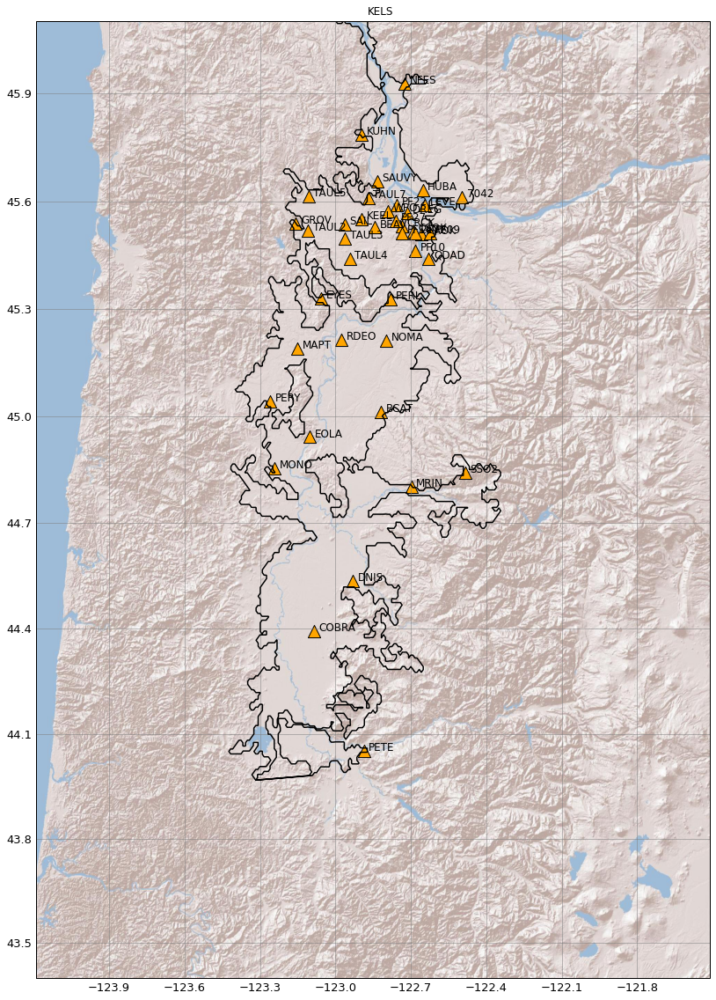

In [305]:
plt.figure(figsize=(15, 20))

ax = plt.axes(projection=ShadedReliefESRI().crs)
ax.set_extent([-124.19,-121.51,43.4,46.1])
ax.add_image(ShadedReliefESRI(), 10)

gl_major = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=1, color='gray', alpha=0.5, linestyle='-')
gl_major.xlabels_top = False
gl_major.ylabels_right = False
gl_major.xlabel_style = {'size': 13}
gl_major.ylabel_style = {'size': 13}

# scat = ax.scatter(st_lon,st_lat, s=200 , c='orange' , transform=ccrs.PlateCarree(),edgecolors='k', marker='^')
# for i in range(len(st_name)):
#     ax.text(st_lon[i]+0.02, st_lat[i],str(st_name[i]), fontsize=12, color='k', transform=ccrs.PlateCarree())
    
scat1 = ax.scatter(valley_st_lon_unq,valley_st_lat_unq, s=200 , c='orange' , transform=ccrs.PlateCarree(),edgecolors='k', marker='^')
for i in range(len(valley_st_nm_unq)):
    ax.text(valley_st_lon_unq[i]+0.02, valley_st_lat_unq[i],str(valley_st_nm_unq[i]), fontsize=12, color='k', transform=ccrs.PlateCarree())

ax.plot(xpn,ypn, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)
ax.plot(xph1,yph1, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)
ax.plot(xph2,yph2, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)

plt.show()

In [92]:
st_file = pd.read_csv('/Users/rshimony/Desktop/WillametteValley/Models/domain_stations.csv')
st_names = st_file['st_name_dom']
st_lons = st_file['st_lon_dom']  
st_lats = st_file['st_lat_dom'] 

/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


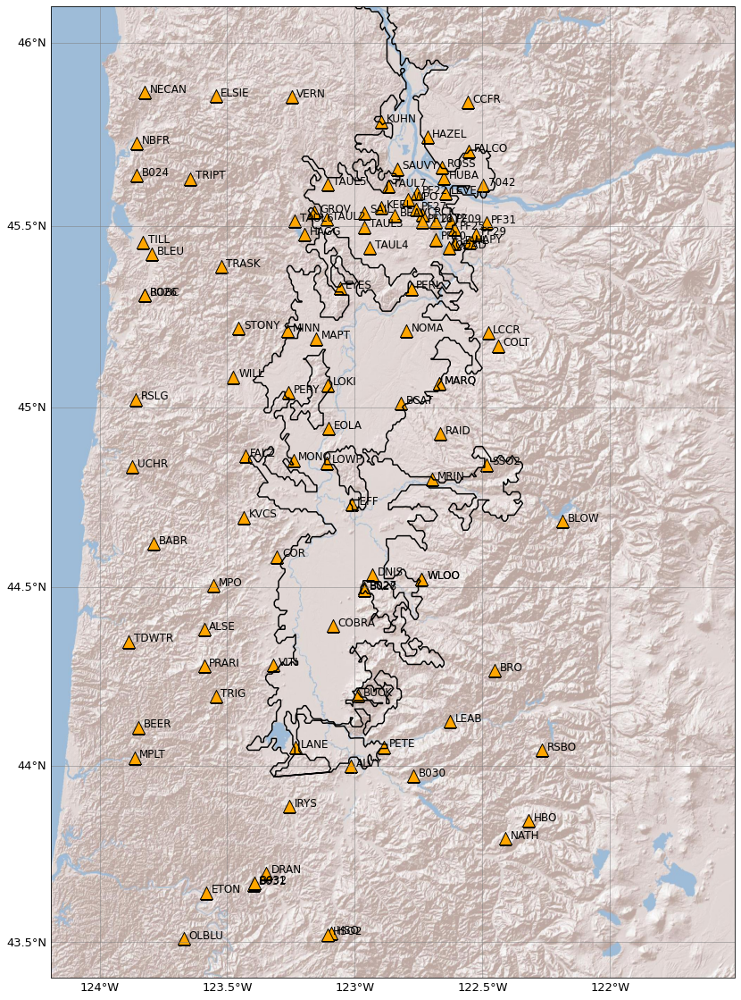

In [93]:
plt.figure(figsize=(15, 20))

ax = plt.axes(projection=ShadedReliefESRI().crs)
ax.set_extent([-124.19,-121.51,43.4,46.1])
ax.add_image(ShadedReliefESRI(), 10)

gl_major = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=1, color='gray', alpha=0.5, linestyle='-')
gl_major.xlabels_top = False
gl_major.ylabels_right = False
gl_major.xlabel_style = {'size': 13}
gl_major.ylabel_style = {'size': 13}

# scat = ax.scatter(st_lon,st_lat, s=200 , c='orange' , transform=ccrs.PlateCarree(),edgecolors='k', marker='^')
# for i in range(len(st_name)):
#     ax.text(st_lon[i]+0.02, st_lat[i],str(st_name[i]), fontsize=12, color='k', transform=ccrs.PlateCarree())
    
scat1 = ax.scatter(st_lons,st_lats, s=200 , c='orange' , transform=ccrs.PlateCarree(),edgecolors='k', marker='^')
for i in range(len(st_names)):
    ax.text(st_lons[i]+0.02, st_lats[i],str(st_names[i]), fontsize=12, color='k', transform=ccrs.PlateCarree())

ax.plot(xpn,ypn, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)
ax.plot(xph1,yph1, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)
ax.plot(xph2,yph2, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)

plt.show()

In [14]:
def get_pgv(stream):
    
    '''
    Gives the PGV from a an obspy stream
    '''
    
    import numpy as np
    import obspy
    
    pgv_list = []
    
    for i in range(len(stream)):
        stream_copy = stream.copy()
        data = stream_copy[i].data
        pgv = np.max(np.abs(data))
        pgv_list.append(pgv)
        
    return(pgv_list) 

In [15]:
def get_pga(stream):
    
    '''
    Gives the PGA from a an obspy stream
    '''
    
    import numpy as np
    import obspy
    
    pga_list = []
    
    for i in range(len(stream)):
        stream_copy = stream.copy()
        acc = obspy.Stream.differentiate(stream_copy)
        data = acc[i].data
        pga = np.max(np.abs(data))
        pga_list.append(pga)
        
    return(pga_list)

In [16]:
def find_vec_norm(Im_value_list):
    '''

    '''
    import numpy as np

    comp_1 = Im_value_list[0]**2;
    comp_2 = Im_value_list[1]**2;
    comp_3 = Im_value_list[2]**2;

    vec_norm = np.sqrt(comp_1 + comp_2 + comp_3)

    return(vec_norm)

In [17]:
def comp_SNR(stream, noisedur, sigstart, sigdur):
    
    SNR_lst = []
    
    for i in range(len(stream)):
    
        time = stream[i].times()
        data = stream[i].data
        noisestart = 1
        noiseend = noisestart + noisedur
        sigend = sigstart + sigdur
        # find indecies
        noise_ind = np.where((time<=noiseend) & (time>=noisestart))[0]
        noise_amp = data[noise_ind]
        noise_avg = float(np.std(noise_amp))

        sig_ind = np.where((time<=sigend) & (time>=sigstart))[0]
        sig_amp = data[sig_ind]
        sig_avg = float(np.std(sig_amp))

        if noise_avg == 0:
            noise_avg = 1E-10
        if sig_avg == 0:
            sig_avg = 1E-10

        SNR=sig_avg/noise_avg
        SNR_lst.append(SNR)

    
    
    return SNR_lst

In [18]:
def arias_I(stream):
    
    '''
    Calculates Arias intensity from an obspy stream.
    Input is in velocity.
    Output is a list of Ia for all traces in stream and the times for easy plotting.
    '''
    
    import numpy as np
    import obspy
    from scipy import integrate
    
    g = 9.80665
    pi = np.pi
    a = (pi/(2*g))
    a_ints = []
    t_list = []
    max_ais = []
    samprate = stream[0].stats.sampling_rate
    npts = stream[0].stats.npts
    t = np.arange(0, npts / samprate, 1 / samprate)
    
    for i in range(len(stream)):
        stream_copy = stream.copy()
        acc = obspy.Stream.differentiate(stream_copy)
        data = acc[i].data
        acc2 = data**2
        acc2_int = integrate.cumtrapz(acc2)
        ia = a*acc2_int
        samprate = stream[i].stats.sampling_rate
        npts = len(ia)
        t = np.arange(0, npts / samprate, 1 / samprate)
        a_ints.append(ia)
        t_list.append(t)
        max_ai = np.max(np.abs(ia))
        max_ais.append(max_ai)
        
    return(a_ints , t_list , max_ais)

In [19]:
# workingdir = '/Users/rshimony/Desktop/WillametteValley/salem_eq/observed_data_salem/'

unfilt_trs = sorted(glob.glob(workingdir + '*_unfilt.sac'))
filt_trs = sorted(glob.glob(workingdir + '*_filt.sac'))

unfilt_strs = []
filt_strs = []

# for i in range(len(filt_trs)):
#     split_1 = filt_trs[i].split('.')
#     st_nm = split_1[1]
#     if st_nm in valley_st_nm_unq:
#         unfilt_str = obs.read(workingdir + '*.' + st_nm + '.*_unfilt.sac')
#         filt_str = obs.read(workingdir + '*.' + st_nm + '.*_filt.sac')        
        
#         unfilt_strs.append(unfilt_str)
#         filt_strs.append(filt_str)

for i in range(len(valley_st_nm_unq)):

    unfilt_str = obs.read(workingdir + '*' + valley_st_nm_unq[i] + '*_unfilt.sac')
    filt_str = obs.read(workingdir + '*' + valley_st_nm_unq[i] + '*_filt.sac')
    unfilt_strs.append(unfilt_str)
    filt_strs.append(filt_str)

unfilt_strs_3 = []
filt_strs_3 = []
    
for i in range(len(unfilt_strs)):
    if len(unfilt_strs[i]) >= 3 and len(filt_strs[i]) >= 3:
        unfilt_strs_3.append(unfilt_strs[i][-3:])
        filt_strs_3.append(filt_strs[i][-3:])
    



In [20]:
# split_1 = filt_trs[0].split('.')

# split_1[1]

# valley_st_nm_unq[0]

unfilt_strs_3[0]

3 Trace(s) in Stream:
GS.CRCK..HN1 | 2022-10-07T12:52:34.000000Z - 2022-10-07T12:54:04.990000Z | 100.0 Hz, 9100 samples
GS.CRCK..HN2 | 2022-10-07T12:52:34.000000Z - 2022-10-07T12:54:04.990000Z | 100.0 Hz, 9100 samples
GS.CRCK..HNZ | 2022-10-07T12:52:34.000000Z - 2022-10-07T12:54:04.990000Z | 100.0 Hz, 9100 samples

In [21]:
filt_strs_3

[3 Trace(s) in Stream:
GS.CRCK..HN1 | 2022-10-07T12:52:34.000000Z - 2022-10-07T12:54:04.990000Z | 100.0 Hz, 9100 samples
GS.CRCK..HN2 | 2022-10-07T12:52:34.000000Z - 2022-10-07T12:54:04.990000Z | 100.0 Hz, 9100 samples
GS.CRCK..HNZ | 2022-10-07T12:52:34.000000Z - 2022-10-07T12:54:04.990000Z | 100.0 Hz, 9100 samples,
 3 Trace(s) in Stream:
GS.CSOK..HN1 | 2022-10-07T12:52:36.000000Z - 2022-10-07T12:54:00.990000Z | 100.0 Hz, 8500 samples
GS.CSOK..HN2 | 2022-10-07T12:52:36.000000Z - 2022-10-07T12:54:00.990000Z | 100.0 Hz, 8500 samples
GS.CSOK..HNZ | 2022-10-07T12:52:36.000000Z - 2022-10-07T12:54:00.990000Z | 100.0 Hz, 8500 samples,
 3 Trace(s) in Stream:
GS.HAOK..HN1 | 2022-10-07T12:52:47.000000Z - 2022-10-07T12:53:47.990000Z | 100.0 Hz, 6100 samples
GS.HAOK..HN2 | 2022-10-07T12:52:47.000000Z - 2022-10-07T12:53:47.990000Z | 100.0 Hz, 6100 samples
GS.HAOK..HNZ | 2022-10-07T12:52:47.000000Z - 2022-10-07T12:53:47.990000Z | 100.0 Hz, 6100 samples,
 3 Trace(s) in Stream:
GS.TAUL2..HHE | 2022-10

In [22]:
print(valley_st_nm_unq)
print(len(valley_st_nm_unq))
print(len(filt_strs_3))
print(len(unfilt_strs_3))
unfilt_strs_3[0][0].stats.station

['CRCK' 'CSOK' 'HAOK' 'TAUL2' 'TAUL3' 'TAUL4' 'TAUL5' 'TAUL7' '2172' '7042'
 'BCAT' 'COBRA' 'DNIS' 'EOLA' 'GROV' 'KUHN' 'MAPT' 'NOMA' 'PERY' 'PETE'
 'PF09' 'PF10' 'PF16' 'PF22' 'PF27' 'RDEO' 'SAUVY' 'BEAV' 'DREG' 'EYES'
 'HUBA' 'KEEL' 'KELS' 'LEVE' 'MONO' 'MRIN' 'NFES' 'PERL' 'QDAD' 'SAIL'
 'SSO2' 'WPO']
42
42
42


'CRCK'

In [23]:
snr_filts = []
snr_unfilts = []
snr_st_nm_filts = []
snr_st_nm_unfilts = []
snr_filt_vals = []

for i in range(len(filt_strs_3)):
    snr_filt = comp_SNR(filt_strs_3[i], 15, 40, 20)

    snr_unfilt = comp_SNR(unfilt_strs_3[i], 15, 40, 20)
    
    snr_avg_filt = find_vec_norm(snr_filt)
    snr_avg_unfilt = find_vec_norm(snr_unfilt)
    
    st_name_filt = filt_strs_3[i][0].stats.station
    
    if snr_avg_filt >= 8 and snr_avg_unfilt >= 8:
        snr_filts.append(filt_strs_3[i])
        snr_st_nm_filts.append(st_name_filt)
        snr_unfilts.append(unfilt_strs_3[i])
        snr_st_nm_unfilts.append(st_name_filt)
        snr_filt_vals.append(snr_avg_filt)
        
#     if snr_avg_unfilt >= 5:
#         snr_unfilts.append(unfilt_strs_3[i])
#         snr_st_nm_unfilts.append(st_name)
    

snr_st_lon = []
snr_st_lat = []

for i in range(len(snr_st_nm_filts)):
    for j in range(len(valley_st_nm_unq)):
        if snr_st_nm_filts[i] == valley_st_nm_unq[j]:
            snr_st_lon.append(valley_st_lon_unq[j])
            snr_st_lat.append(valley_st_lat_unq[j])
            

In [24]:
stations = pd.read_csv('/Users/rshimony/Desktop/WillametteValley/salem_eq/metadata/station_inventory.csv')
st_lat = stations['latitude']
st_lon = stations['longitude']
st_net = stations['network']
st_name = stations['name']
st_channel = stations['channel']

st_name_unq = pd.unique(st_name)
st_lat_unq = pd.unique(st_lat)
st_lon_unq = pd.unique(st_lon)

print(st_name[6])
print(st_lat[6])
print(st_lon[6])
print(st_name_unq[2])
print(st_lat_unq[2])
print(st_lon_unq[2])

HIYU
45.43523
-121.807396
HIYU
45.43523
-121.807396


In [86]:
workingdir = '/Users/rshimony/Desktop/WillametteValley/salem_eq/observed_data_salem_1hz/'

data_strm = obs.read(workingdir + '*_unfilt.sac')

data_stations = []

for i in range(len(data_strm)):
    data_stations.append(data_strm[i].stats.station)
    
data_stations_unq = np.unique(data_stations)

strings = []

for i in range(len(data_stations_unq)):
    string = obs.read(workingdir + '*' + data_stations_unq[i] + '*_unfilt.sac')
    strings.append(string)

strs_3 = []
    
for i in range(len(strings)):
    if len(strings[i]) >= 3:
        strs_3.append(strings[i][-3:])
    
snr_strs = []
snr_strs_nm = []

for i in range(len(strs_3)):
    snr_str = comp_SNR(strs_3[i], 15, 40, 20)

    snr_avg_str = find_vec_norm(snr_str)
    
    snr_name = strs_3[i][0].stats.station
    
    if snr_avg_str >= 8:
        snr_strs.append(strs_3[i])
        snr_strs_nm.append(snr_name)

snr_lons = []
snr_lats = []
snr_name_unq = []

for i in range(len(snr_strs_nm)):
    for j in range(len(st_name_unq)):
        if snr_strs_nm[i] == st_name_unq[j]:
            snr_lons.append(st_lon_unq[j])
            snr_lats.append(st_lat_unq[j])
            snr_name_unq.append(st_name_unq[j])
            
            
meta_dir = '/Users/rshimony/Desktop/WillametteValley/salem_eq/metadata/'

ldict = {'st_nm':snr_name_unq, 'st_lon':snr_lons, 'st_lat':snr_lats,}
ldf = pd.DataFrame(ldict)
ldf.to_csv(meta_dir + 'snr_stations.csv',index=False)


In [64]:
# trace = obs.read(traces[0])
# trace[0].stats.station

len(st_name_unq)
# st_name_unq
# data_stations_unq
# strs_3
# snr_strs_nm
snr_strs

[3 Trace(s) in Stream:
NP.2172..HNE | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 200.0 Hz, 33001 samples
NP.2172..HNN | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 200.0 Hz, 33001 samples
NP.2172..HNZ | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 200.0 Hz, 33001 samples,
 3 Trace(s) in Stream:
NP.7042..HNE | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 200.0 Hz, 33001 samples
NP.7042..HNN | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 200.0 Hz, 33001 samples
NP.7042..HNZ | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 200.0 Hz, 33001 samples,
 3 Trace(s) in Stream:
UW.ABER..HHE | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 100.0 Hz, 16501 samples
UW.ABER..HHN | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 100.0 Hz, 16501 samples
UW.ABER..HHZ | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 100.0 Hz, 16501 samples,
 3 Trace(s) in Stream:
UO.ALSE..HHE |

In [28]:
if split2 == '1hz':
    snr_st_lon_1hz = snr_st_lon
    snr_st_lat_1hz = snr_st_lat
elif split2 == '2hz':
    snr_st_lon_2hz = snr_st_lon
    snr_st_lat_2hz = snr_st_lat
elif split2 == '3hz':
    snr_st_lon_3hz = snr_st_lon
    snr_st_lat_3hz = snr_st_lat
elif split2 == '5hz':
    snr_st_lon_5hz = snr_st_lon
    snr_st_lat_5hz = snr_st_lat

In [29]:
snr_st_lon_1hz

[-123.10993700000002,
 -122.96268000000001,
 -122.94232599999999,
 -123.10693300000001,
 -122.86973400000001,
 -122.81889,
 -123.0855,
 -122.930978,
 -123.10210600000001,
 -123.157477,
 -122.89578999999999,
 -123.15245,
 -122.79791999999999,
 -123.26018999999999,
 -122.88698899999999,
 -122.683066,
 -122.73606000000001,
 -122.75693500000001,
 -122.76001599999999,
 -122.975219,
 -122.83434,
 -122.8428,
 -122.715,
 -122.6434,
 -123.24096999999999,
 -122.69828000000001,
 -122.9628,
 -122.483434]

In [30]:
print((snr_filts[0]))
print(len(snr_st_nm_filts))
print((snr_st_nm_unfilts))

3 Trace(s) in Stream:
GS.TAUL2..HHE | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 100.0 Hz, 16501 samples
GS.TAUL2..HHN | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 100.0 Hz, 16501 samples
GS.TAUL2..HHZ | 2022-10-07T12:52:15.000000Z - 2022-10-07T12:55:00.000000Z | 100.0 Hz, 16501 samples
28
['TAUL2', 'TAUL3', 'TAUL4', 'TAUL5', 'TAUL7', 'BCAT', 'COBRA', 'DNIS', 'EOLA', 'GROV', 'KUHN', 'MAPT', 'NOMA', 'PERY', 'PETE', 'PF10', 'PF16', 'PF22', 'PF27', 'RDEO', 'SAUVY', 'BEAV', 'DREG', 'LEVE', 'MONO', 'MRIN', 'SAIL', 'SSO2']


39.0214698926


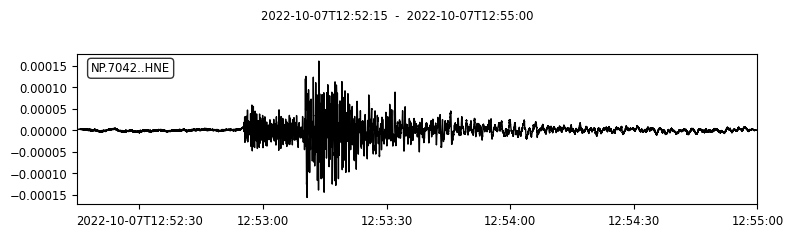

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  fig.canvas.print_figure(bytes_io, **kw)


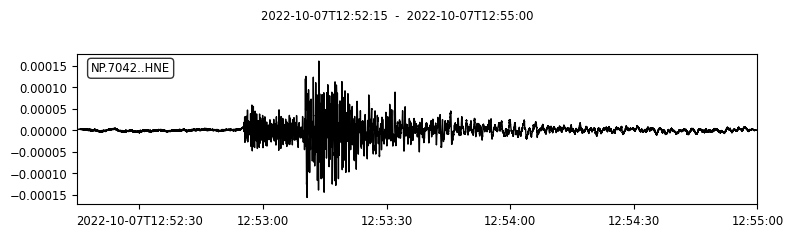

In [87]:
from obspy.signal.trigger import plot_trigger, trigger_onset
trace = snr_strs[1][0]
df = trace.stats.sampling_rate
print(snr_filt_vals[21])
trace.plot()

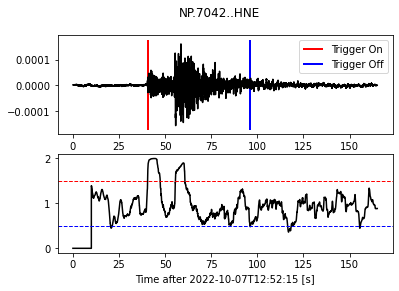

In [89]:
from obspy.signal.trigger import classic_sta_lta
cft = classic_sta_lta(trace.data, int(5 * df), int(10 * df))
on_of = trigger_onset(cft, 1.5, 0.5)
plot_trigger(trace, cft, 1.5, 0.5)

[  6.67906739e-15   1.32728826e-14   1.97536232e-14 ...,   4.62050457e-06
   4.62050502e-06   4.62050502e-06]
30.49


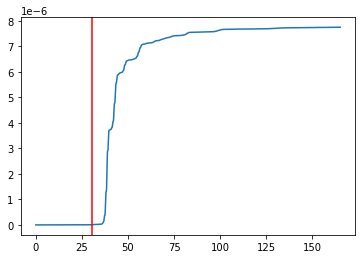

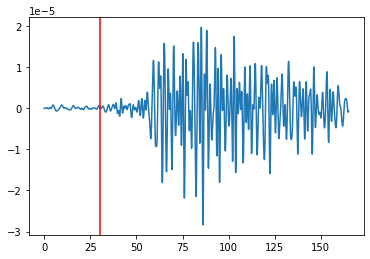

In [304]:
arias = arias_I(snr_filts[5])
a_int,a_t = arias[0],arias[1]


arival_loc = np.where(a_int[1] > 5e-9)
arrival_t = a_t[1][arival_loc[0][0]]
print(a_int[0])
print(arrival_t)

plt.figure()
plt.plot(a_t[1],a_int[1])
plt.axvline(x = arrival_t , color = 'r', label = 'Arrival')
plt.show()

plt.figure()
plt.plot(snr_filts[1][1].times(),snr_filts[1][1].data)
plt.axvline(x = arrival_t , color = 'r', label = 'Arrival')
plt.show()


In [ ]:
# print(on_of[0][0])
print(len(trace.times()))
print(df)
# print((on_of[0][0])/df)
print(trace.times())
print(trace.stats.channel)

<ipython-input-91-52b0eec14827>:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


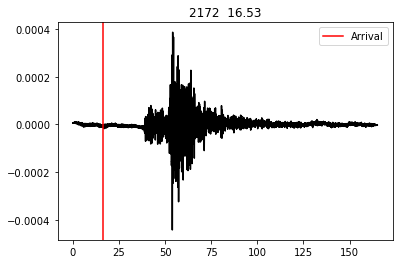

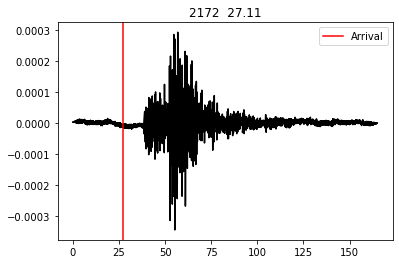

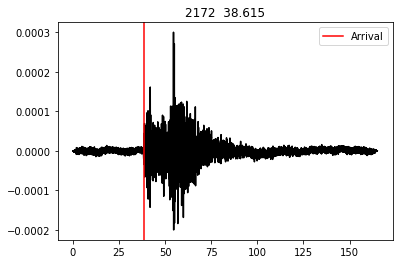

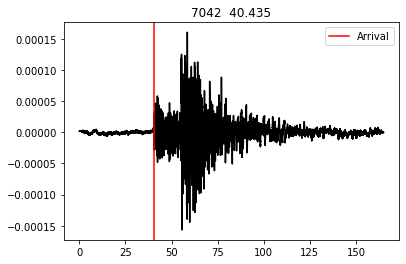

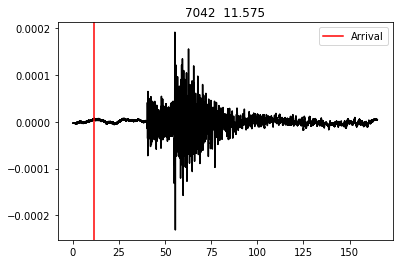

...

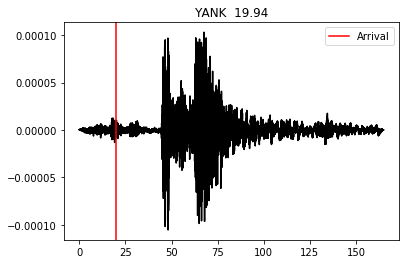

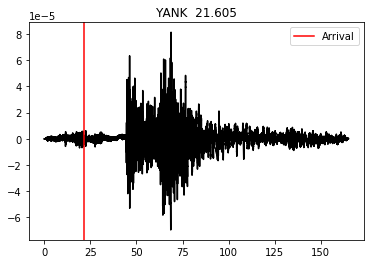

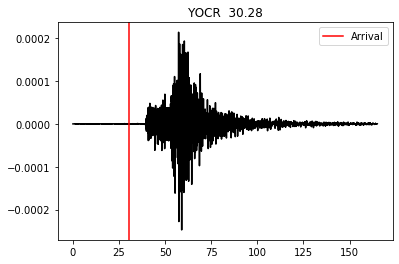

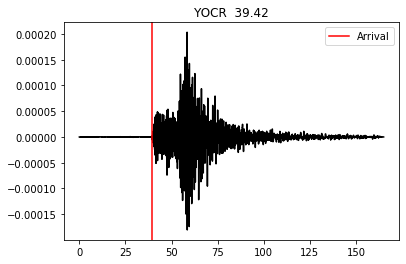

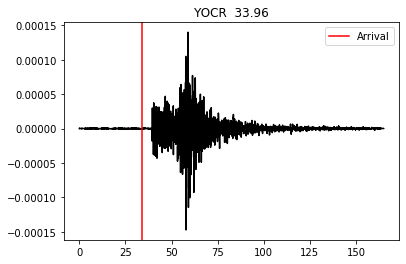

In [91]:
arrivals = []

for i in range(len(snr_strs)):
    arrivals_init = []
    for j in range(3):
        trace = snr_strs[i][j]
        df = trace.stats.sampling_rate
        cft = classic_sta_lta(trace.data, int(5 * df), int(10 * df))
        on_of = trigger_onset(cft, 1.5, 0.5)
        
        arrival_t = (on_of[0][0])/df
        arrivals_init.append(arrival_t)
        tr_data = trace.data
        tr_times = trace.times()
        channel = trace.stats.channel

        
        dict_arvs = {'arrival_t':arrival_t , 'st_nm':snr_strs_nm[i] , 'channel':channel}
        
        if i == 0:
            df_arvs = pd.DataFrame(data=dict_arvs,index=[0])
        else:
            df_arvs_temp = pd.DataFrame(data=dict_arvs , index=[i])
            df_arvs = pd.concat([df_arvs, df_arvs_temp], ignore_index=True)
        
        plt.figure()
        plt.plot(tr_times,tr_data , color = 'k')
        plt.axvline(x = arrival_t , color = 'r', label = 'Arrival')
        plt.title(snr_strs_nm[i] + ' ' + ' ' + str(arrival_t))
        plt.legend()
        plt.savefig('/Users/rshimony/Desktop/WillametteValley/salem_eq/arrivals/unfilt/' 
                    + snr_strs_nm[i] + '_' + channel,dpi=200,bbox_inches='tight')
        
    arrival_avg = find_vec_norm(arrivals_init)
    arrivals.append(arrival_avg)
df_arvs.to_csv('/Users/rshimony/Desktop/WillametteValley/salem_eq/arrivals/arrival_t_unfilt.csv',index=False)    
        

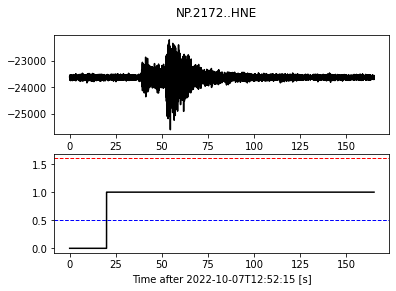

In [67]:
plot_trigger(trace, cft, 1.6, 0.5)

In [ ]:
len(arrivals)

In [ ]:
pgv_filt_ls = []
pgv_unf_ls = []
pga_filt_ls = []
pga_unf_ls = []

for i in range(len(snr_unfilts)):
    pgv_unf = get_pgv(snr_unfilts[i])
    pgv_unf_avg = find_vec_norm(pgv_unf)
    pgv_unf_ls.append(pgv_unf_avg)
    
    pgv_filt = get_pgv(snr_filts[i])
    pgv_filt_avg = find_vec_norm(pgv_filt)
    pgv_filt_ls.append(pgv_filt_avg)
    
    pga_unf = get_pga(snr_unfilts[i])
    pga_unf_avg = find_vec_norm(pga_unf)
    pga_unf_ls.append(pga_unf_avg)
    
    pga_filt = get_pga(snr_filts[i])
    pga_filt_avg = find_vec_norm(pga_filt)
    pga_filt_ls.append(pga_filt_avg)
    
   

In [ ]:
pgv_ratio = (np.array(pgv_filt_ls)) / (np.array(pgv_unf_ls))
pga_ratio = (np.array(pga_filt_ls)) / (np.array(pga_unf_ls))

pgv_ratio

In [ ]:
if split2 == '1hz':
    pgv_ratio_1hz = pgv_ratio
    pga_ratio_1hz = pga_ratio
elif split2 == '2hz':
    pgv_ratio_2hz = pgv_ratio
    pga_ratio_2hz = pga_ratio
elif split2 == '3hz':
    pgv_ratio_3hz = pgv_ratio
    pga_ratio_3hz = pga_ratio
elif split2 == '5hz':
    pgv_ratio_5hz = pgv_ratio
    pga_ratio_5hz = pga_ratio

In [ ]:
# pgv_ratio_5hz[0]
pgv_ratio_5hz

In [ ]:
plt.figure(figsize=(10, 15))

ax = plt.axes(projection=ShadedReliefESRI().crs)
ax.set_extent([-124.19,-121.51,43.4,46.1])
ax.add_image(ShadedReliefESRI(), 10)

gl_major = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=1, color='gray', alpha=0.5, linestyle='-')
gl_major.xlabels_top = False
gl_major.ylabels_right = False
gl_major.xlabel_style = {'size': 13}
gl_major.ylabel_style = {'size': 13}

# scat = ax.scatter(st_lon,st_lat, s=200 , c='orange' , transform=ccrs.PlateCarree(),edgecolors='k', marker='^')
# for i in range(len(st_name)):
#     ax.text(st_lon[i]+0.02, st_lat[i],str(st_name[i]), fontsize=12, color='k', transform=ccrs.PlateCarree())
    
scat1 = ax.scatter(snr_st_lon,snr_st_lat, s=120 , c=arrivals , transform=ccrs.PlateCarree(),edgecolors='k', marker='^')
# for i in range(len(snr_st_nm_filts)):
#     ax.text(snr_st_lon[i]+0.02, snr_st_lat[i],str(snr_st_nm_filts[i]), fontsize=12, color='k', transform=ccrs.PlateCarree())

cb=plt.colorbar(scat1,fraction=0.035, pad=0.08)
# cb.set_alpha(1)
cb.set_label('PGA Filt/Unfilt')
# cb.draw_all()
    
ax.plot(xpn,ypn, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)
ax.plot(xph1,yph1, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)
ax.plot(xph2,yph2, transform=ccrs.PlateCarree() , c="k" , linewidth=1.5 , alpha=1)

plt.title(workingdir.split('/')[-2])
# plt.savefig('/Users/rshimony/Desktop/WillametteValley/salem_eq/' + (workingdir.split('/')[-2]) + '.png',
#             dpi=200,bbox_inches='tight')
plt.show()

In [ ]:
plt.figure(figsize=(12,7))

plt.scatter(snr_st_lat_1hz,pgv_ratio_1hz,label = '1hz' , marker = '*')
plt.scatter(snr_st_lat_2hz,pgv_ratio_2hz,label = '2hz', marker = 'o')
plt.scatter(snr_st_lat_3hz,pgv_ratio_3hz,label = '3hz', marker = '^')
plt.scatter(snr_st_lat_5hz,pgv_ratio_5hz,label = '5hz', marker = 'x')
plt.legend(loc = 'upper left')
plt.xlabel('Latitude (deg)')
plt.ylabel('PGV Ratio - filt/unfilt')

plt.show()